In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import csv

In [2]:
df = pd.read_csv('BankChurners.csv')

In [3]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [4]:
df.isna().sum()

CLIENTNUM                                                                                                                             0
Attrition_Flag                                                                                                                        0
Customer_Age                                                                                                                          0
Gender                                                                                                                                0
Dependent_count                                                                                                                       0
Education_Level                                                                                                                       0
Marital_Status                                                                                                                        0
Income_Category                                 

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

In [6]:
df = df.drop(["CLIENTNUM", 
                "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1",
                "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2"
               ], axis=1)

In [7]:
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [8]:
from pandas_profiling import ProfileReport

In [9]:
credit_card_report = ProfileReport(df)

In [10]:
credit_card_report

Summarize dataset:   0%|          | 0/33 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()
df['Class'] = LE.fit_transform(df['Attrition_Flag'])
df.drop(['Attrition_Flag'], axis=1, inplace=True)

In [12]:
original_df = df.copy(deep=True)

original_df.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Class
0,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,1
1,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,1
2,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,1
3,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,1
4,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,1


In [13]:
df = original_df.copy(deep=True)
df.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Class
0,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,1
1,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,1
2,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,1
3,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,1
4,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,1


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_Age              10127 non-null  int64  
 1   Gender                    10127 non-null  object 
 2   Dependent_count           10127 non-null  int64  
 3   Education_Level           10127 non-null  object 
 4   Marital_Status            10127 non-null  object 
 5   Income_Category           10127 non-null  object 
 6   Card_Category             10127 non-null  object 
 7   Months_on_book            10127 non-null  int64  
 8   Total_Relationship_Count  10127 non-null  int64  
 9   Months_Inactive_12_mon    10127 non-null  int64  
 10  Contacts_Count_12_mon     10127 non-null  int64  
 11  Credit_Limit              10127 non-null  float64
 12  Total_Revolving_Bal       10127 non-null  int64  
 13  Avg_Open_To_Buy           10127 non-null  float64
 14  Total_

In [15]:
# Encoding Binary variables.
df['Gender'] = df['Gender'].map({'M':1, 'F':0})

In [16]:
#Finding all the categorical columns from the data

categorical_columns = df.select_dtypes(exclude=['int64', 'float64', 'int32']).columns
numerical_columns = df.drop('Class', axis=1).select_dtypes(include=['int64', 'float64'])

In [17]:
categorical_columns

Index(['Education_Level', 'Marital_Status', 'Income_Category',
       'Card_Category'],
      dtype='object')

In [18]:
numerical_columns
df.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Class
0,45,1,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,1
1,49,0,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,1
2,51,1,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,1
3,40,0,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,1
4,40,1,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,1


In [19]:
# One hot encoding independent variable x
def encode_and_bind(original_dataframe, feature_to_encode):
    dummies =pd.get_dummies(original_dataframe[[feature_to_encode]])
    res = pd.concat([original_dataframe, dummies], axis=1)
    res = res.drop([feature_to_encode], axis=1)
    return(res)

In [20]:
for feature in categorical_columns:
    df = encode_and_bind(df, feature)
    
df.head()

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,...,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,45,1,3,39,5,1,3,12691.0,777,11914.0,...,0,0,1,0,0,0,1,0,0,0
1,49,0,5,44,6,1,2,8256.0,864,7392.0,...,0,0,0,0,1,0,1,0,0,0
2,51,1,3,36,4,1,0,3418.0,0,3418.0,...,0,0,0,1,0,0,1,0,0,0
3,40,0,4,34,3,4,1,3313.0,2517,796.0,...,0,0,0,0,1,0,1,0,0,0
4,40,1,3,21,5,1,0,4716.0,0,4716.0,...,0,0,1,0,0,0,1,0,0,0


In [21]:
df.shape

(10127, 37)

In [22]:
X = df.drop(['Class'], axis=1).values
y = df['Class']
y.shape

(10127,)

In [23]:
# splitting the dataset into train and test datasets

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [24]:
from xgboost import XGBClassifier

In [25]:
xgb = XGBClassifier(random_state=42)
xgb.fit(X_train, y_train)


C:\Users\sumitb\Anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:18:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [26]:
#Predicting the test set

y_pred = xgb.predict(X_test)

In [27]:
# Making the confusion matrix and calculating accuracy score
from sklearn.metrics import classification_report , accuracy_score, roc_auc_score
from sklearn import metrics

accuracy = accuracy_score(y_test, y_pred)
print(accuracy)

print(classification_report(y_test, y_pred))

print(roc_auc_score(y_test, y_pred))


fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
auc = metrics.auc(fpr, tpr)
print(auc)

0.9674234945705824
              precision    recall  f1-score   support

           0       0.91      0.89      0.90       496
           1       0.98      0.98      0.98      2543

    accuracy                           0.97      3039
   macro avg       0.94      0.94      0.94      3039
weighted avg       0.97      0.97      0.97      3039

0.9359052522420814
0.9359052522420814


In [28]:
# Importing packages for SMOTE
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import RandomUnderSampler

from imblearn.pipeline import Pipeline

from collections import Counter

In [29]:
sm = SMOTE(sampling_strategy='auto', random_state=42)
X_sm, y_sm = sm.fit_resample(X_train, y_train)

In [30]:
print(Counter(y_train))
print(Counter(y_sm))

Counter({1: 5957, 0: 1131})
Counter({1: 5957, 0: 5957})


In [31]:
over = BorderlineSMOTE(sampling_strategy=0.3)
under = BorderlineSMOTE(sampling_strategy=0.6)

steps = [('o' , over), ('u', under)]

In [32]:
pipeline = Pipeline(steps)

#transform the datasets
X_sm_us, y_sm_us = pipeline.fit_resample(X_train, y_train)

print(Counter(y_train))
print(Counter(y_sm_us))

Counter({1: 5957, 0: 1131})
Counter({1: 5957, 0: 3574})


In [33]:
list(Counter(y_train).keys())

[1, 0]

In [34]:
xgb_1= XGBClassifier(random_state=42)
xgb_1.fit(X_sm, y_sm)

[21:18:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\sumitb\Anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [35]:
y_pred_1 = xgb_1.predict(X_test)

accuracy_1 = accuracy_score(y_test, y_pred_1)
print(accuracy_1)

print(classification_report(y_test, y_pred_1))

print(roc_auc_score(y_test, y_pred_1))


fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_1)
auc = metrics.auc(fpr, tpr)
print(auc)


0.9680816057913787
              precision    recall  f1-score   support

           0       0.90      0.91      0.90       496
           1       0.98      0.98      0.98      2543

    accuracy                           0.97      3039
   macro avg       0.94      0.94      0.94      3039
weighted avg       0.97      0.97      0.97      3039

0.9444129520632223
0.9444129520632223


In [36]:
xgb_2= XGBClassifier(random_state=42)
xgb_2.fit(X_sm_us, y_sm_us)

C:\Users\sumitb\Anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:18:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [37]:
y_pred_2 = xgb_2.predict(X_test)

accuracy_2 = accuracy_score(y_test, y_pred_2)
print(accuracy_2)

print(classification_report(y_test, y_pred_2))

print(roc_auc_score(y_test, y_pred_2))


fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_2)
auc = metrics.auc(fpr, tpr)
print(auc)

0.9667653833497861
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       496
           1       0.98      0.98      0.98      2543

    accuracy                           0.97      3039
   macro avg       0.94      0.94      0.94      3039
weighted avg       0.97      0.97      0.97      3039

0.9395692476500958
0.9395692476500958


# #Generate new DataFrame with SMOTE and UnderSampling data

In [38]:
# Names of the independent variable
features_names = list(df.drop('Class', axis=1).columns)
features_names

['Customer_Age',
 'Gender',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio',
 'Education_Level_College',
 'Education_Level_Doctorate',
 'Education_Level_Graduate',
 'Education_Level_High School',
 'Education_Level_Post-Graduate',
 'Education_Level_Uneducated',
 'Education_Level_Unknown',
 'Marital_Status_Divorced',
 'Marital_Status_Married',
 'Marital_Status_Single',
 'Marital_Status_Unknown',
 'Income_Category_$120K +',
 'Income_Category_$40K - $60K',
 'Income_Category_$60K - $80K',
 'Income_Category_$80K - $120K',
 'Income_Category_Less than $40K',
 'Income_Category_Unknown',
 'Card_Category_Blue',
 'Card_Category_Gold',
 'Card_Category_Platinum',
 'Card_Category_Silver']

In [39]:
# Concatenate train (with resampling) and test sets to build the new dataframe 
sm_us_X = np.concatenate((X_sm_us, X_test))
sm_us_y = np.concatenate((y_sm_us, y_test))

In [40]:
sm_us_df = pd.DataFrame(np.column_stack([sm_us_X, sm_us_y]), columns=['Class'] + features_names)
sm_us_df.head()

,Class,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,49.0,1.0,2.0,38.0,3.0,2.0,0.0,8077.0,1965.0,6112.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,61.0,0.0,0.0,51.0,4.0,2.0,2.0,8476.0,0.0,8476.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0
2,27.0,1.0,0.0,19.0,1.0,1.0,3.0,34516.0,1131.0,33385.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
3,52.0,0.0,1.0,36.0,1.0,1.0,3.0,3040.0,2517.0,523.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
4,44.0,0.0,3.0,36.0,2.0,3.0,3.0,2228.0,0.0,2228.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0


In [41]:
from sklearn.ensemble import RandomForestClassifier

rfclf = RandomForestClassifier(random_state=42)
rfclf.fit(X_sm_us, y_sm_us)


RandomForestClassifier(random_state=42)

In [42]:
rfclf.feature_importances_

array([0.0251478 , 0.02643103, 0.01327094, 0.01741341, 0.05638901,
       0.05659095, 0.06267448, 0.02100335, 0.04344486, 0.02590793,
       0.04928544, 0.1459458 , 0.17142212, 0.10138764, 0.03086582,
       0.00224432, 0.0023975 , 0.01601285, 0.00590477, 0.00296715,
       0.0043556 , 0.00349387, 0.00369568, 0.03243386, 0.02349445,
       0.0029324 , 0.00186822, 0.00383867, 0.00644458, 0.01610127,
       0.00641922, 0.01037246, 0.00279052, 0.00202543, 0.00029895,
       0.00272763])

In [43]:
features_to_plot = 25

importances = rfclf.feature_importances_
indices = np.argsort(importances)

best_vars = np.array(features_names)[indices][-features_to_plot:]
values = importances[indices][-features_to_plot:]
best_vars

array(['Income_Category_$40K - $60K', 'Education_Level_Uneducated',
       'Education_Level_High School', 'Income_Category_Less than $40K',
       'Income_Category_$60K - $80K', 'Income_Category_Unknown',
       'Dependent_count', 'Education_Level_Graduate',
       'Income_Category_$80K - $120K', 'Months_on_book', 'Credit_Limit',
       'Marital_Status_Single', 'Customer_Age', 'Avg_Open_To_Buy',
       'Gender', 'Avg_Utilization_Ratio', 'Marital_Status_Married',
       'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Total_Ct_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct'], dtype='<U30')

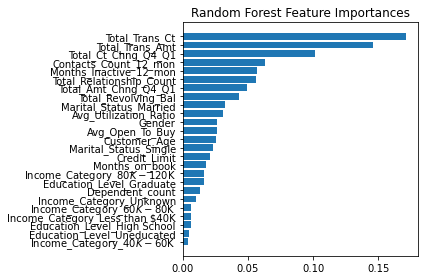

In [44]:
y_ticks = np.arange(0, features_to_plot)
fig, ax = plt.subplots()
ax.barh(y_ticks, values)
ax.set_yticklabels(best_vars)
ax.set_yticks(y_ticks)
ax.set_title("Random Forest Feature Importances")
fig.tight_layout()
plt.show()

In [45]:
best_vars = best_vars[-20:]
best_vars

array(['Income_Category_Unknown', 'Dependent_count',
       'Education_Level_Graduate', 'Income_Category_$80K - $120K',
       'Months_on_book', 'Credit_Limit', 'Marital_Status_Single',
       'Customer_Age', 'Avg_Open_To_Buy', 'Gender',
       'Avg_Utilization_Ratio', 'Marital_Status_Married',
       'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Total_Ct_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct'], dtype='<U30')

## Machine Learning | H2O

In [46]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future

In [47]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


In [48]:
from h2o.automl import H2OAutoML
import h2o
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
; Java HotSpot(TM) 64-Bit Server VM (build 25.181-b13, mixed mode)
  Starting server from C:\Users\sumitb\Anaconda3\Lib\site-packages\h2o\backend\bin\h2o.jar
  Ice root: C:\Users\sumitb\AppData\Local\Temp\tmp8osjxl61
  JVM stdout: C:\Users\sumitb\AppData\Local\Temp\tmp8osjxl61\h2o_sumitB_started_from_python.out
  JVM stderr: C:\Users\sumitb\AppData\Local\Temp\tmp8osjxl61\h2o_sumitB_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Asia/Kolkata
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.32.0.3
H2O_cluster_version_age:,1 month and 1 day
H2O_cluster_name:,H2O_from_python_sumitB_6onsoj
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.523 Gb
H2O_cluster_total_cores:,8
H2O_cluster_allowed_cores:,8
H2O_cluster_status:,"accepting new members, healthy"


In [49]:
hf = h2o.H2OFrame(sm_us_df[['Class'] + list(best_vars)])
hf.head()

Parse progress: |█████████████████████████████████████████████████████████| 100%


Class,Income_Category_Unknown,Dependent_count,Education_Level_Graduate,Income_Category_$80K - $120K,Months_on_book,Credit_Limit,Marital_Status_Single,Customer_Age,Avg_Open_To_Buy,Gender,Avg_Utilization_Ratio,Marital_Status_Married,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Ct_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct
49,1,38,0,0,3,1965,0,1,0.637,2,0,0,6112,1329,2,0,8077,0.243,26,0.444
61,1,51,1,0,4,0,0,0,0.675,0,0,1,8476,3889,2,2,8476,0,67,0.489
27,0,19,0,0,1,1131,1,1,0.715,0,1,0,33385,14716,1,3,34516,0.033,112,0.75
52,1,36,0,1,1,2517,0,0,0.774,1,0,0,523,4608,1,3,3040,0.828,61,1.033
44,1,36,1,1,2,0,0,0,0.686,3,0,1,2228,2523,3,3,2228,0,45,0.607
51,1,36,0,0,3,1449,0,0,0.703,3,1,0,11156,1870,2,3,12605,0.115,56,0.647
57,1,42,0,0,6,1211,0,1,0.813,0,0,1,7166,1797,4,3,8377,0.145,44,1.2
45,1,35,0,1,6,1686,0,0,0.702,0,1,0,4237,1236,1,3,5923,0.285,35,0.591
57,1,47,0,1,4,2468,0,0,0.598,1,0,0,948,1536,1,3,3416,0.722,42,0.556
48,1,43,0,1,6,1773,0,0,0.574,3,0,1,650,2038,2,2,2423,0.732,64,0.362


In [50]:
hf['Class'] = hf['Class'].asfactor()
predictors = hf.drop('Class').columns
response = 'Class'

H2OValueError: Only 'int' or 'string' are allowed for asfactor(), got Class:real 